python3 SpikeCounter/cluster/run_preprocess_stim_jobs.py /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/ 20 --remove_from_start 0 --remove_from_end 20 --zsc_threshold 4 --upper 1 --start_from_downsampled 0 > jobs.txt

In [1]:
import sys
from pathlib import Path
import os
import warnings
import time
SPIKECOUNTER_PATH = os.getenv("SPIKECOUNTER_PATH")
sys.path.append(SPIKECOUNTER_PATH)

import numpy as np
import skimage.io as skio
import scipy.io as scio
from scipy import ndimage, signal, stats, interpolate, optimize
from skimage import transform, morphology, filters, measure
from sklearn import decomposition, cluster
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import colors, patches, lines
from tifffile import imsave, imread
import os
from spikecounter.analysis import traces, images
from spikecounter.ui import visualize
from spikecounter import utils
import pandas as pd
from skimage.util import img_as_ubyte
from datetime import datetime
import pickle
from IPython.display import SVG, display
import colorcet as cc
import seaborn as sns
from cycler import cycler
import pandas as pd
import importlib
import re
import warnings
import mat73
warnings.filterwarnings('ignore')

biopubs_style_path = os.path.join(os.getenv("SPIKECOUNTER_PATH"), "config", "bio_publications.mplstyle")
plt.style.use(biopubs_style_path)

In [2]:
expt_name = "20220707_cochr_prebeat_excitability"
output_datadir = Path(os.getenv("ANALYSIS_OUTPUT_ROOTDIR"), "2022 First Heartbeat_Submitted", 
                       "Figures/Data/Figure4/", expt_name)
os.makedirs(output_datadir, exist_ok=True)
rootdir = Path(os.getenv("DATA_ROOTDIR"), expt_name)
subfolder = "corrected"

In [3]:
os.makedirs(os.path.join(rootdir, "analysis"), exist_ok=True)

In [4]:
expt_info = pd.read_csv(rootdir/"analysis"/"experiment_data.csv").sort_values("start_time")
expt_info = utils.process_experiment_metadata(expt_info,\
                                             regexp_dict={"experiment": r"(?<=_)\w+(?=_t\d+)"}).set_index("experiment")
expt_info = expt_info.loc["preheart_stim"].reset_index()
expt_info.drop(2, axis=0, inplace=True)

### Test heart autosegmentation

In [5]:
def transrot_to_matrix(transrot):
    tform = np.zeros((3,3))
    tform[:2,2] = transrot[0,:]
    tform[2,2] = 1
    tform[:2,:2] = transrot[1:,:].T
    return tform

In [6]:
dmd_target_mask = imread(os.path.join(rootdir, "074654dmd_mask.tif"))
tform = transrot_to_matrix(scio.loadmat(os.path.join(rootdir, "074709dmd_tform.mat"))['regdata'])

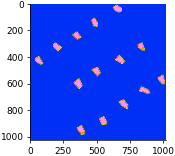

In [7]:
dmd_target_img_coord = transform.warp(dmd_target_mask, np.linalg.inv(tform), output_shape=(1024,1024))
plt.imshow(dmd_target_img_coord)

In [8]:
skio.imsave(os.path.join(rootdir, "mask.tif"), dmd_target_img_coord)

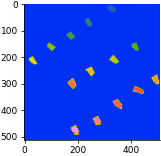

In [9]:
dmd_target_img_coord = skio.imread(os.path.join(rootdir, "mask.tif"))
mask = dmd_target_img_coord > 0
mask = morphology.binary_closing(mask, morphology.disk(5))
mask = transform.rescale(mask, (0.5,0.5))
labels = measure.label(mask)
plt.imshow(labels)

In [11]:
test, expt_data = images.load_image(rootdir, "081902_preheart_stim_t1_p1_z1", subfolder="corrected")

In [12]:
mean_img = test.max(axis=0)

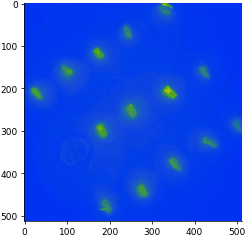

In [13]:
%matplotlib inline
plt.imshow(mean_img)

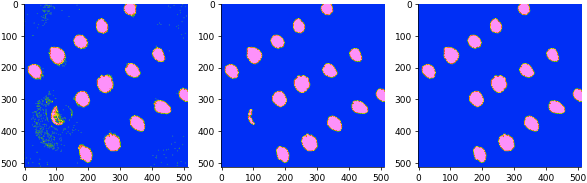

In [14]:
fig1, axes = plt.subplots(1, 3, figsize=(10, 3))
axes = axes.ravel()
block_size=201
offset = -0.1
min_size = 600
threshold = filters.threshold_local(mean_img, block_size, offset=offset)
mask = mean_img > threshold
axes[0].imshow(mask)
mask = morphology.binary_opening(mask, footprint=morphology.disk(3))
axes[1].imshow(mask)
mask = morphology.remove_small_objects(mask, min_size=min_size)
axes[2].imshow(mask)

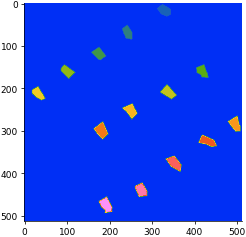

In [17]:
individual_embryos, _, rotated_mask, split_mask = images.split_embryos(test, offset=-0.1,\
                                            min_obj_size=600, extra_split_arrays=[labels],\
                                            manual_roi_seeds=labels)
split_mask = split_mask[0]

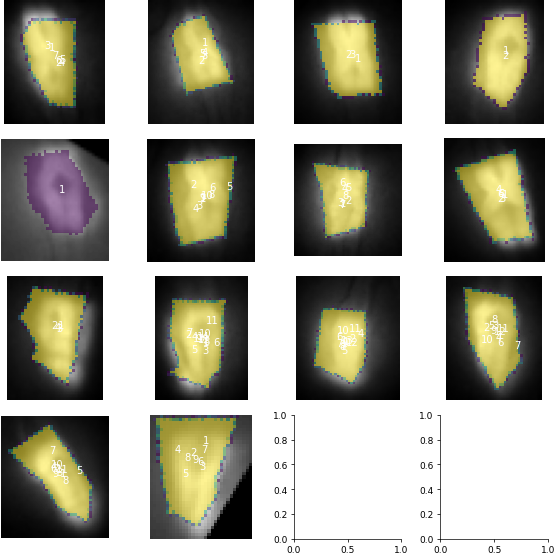

In [18]:
fig1, axes = visualize.tile_plots_conditions(np.arange(len(individual_embryos)), (2,2), disp_titles=False)
for i in range(len(individual_embryos)):
    visualize.display_roi_overlay(individual_embryos[i].mean(axis=0), split_mask[i], ax=axes[i])
    axes[i].set_axis_off()
plt.tight_layout()

Split embryos

In [48]:
%matplotlib agg
subfolder = "corrected"
mask_path = rootdir/"analysis"/subfolder/"individual_fish_recordings"/"masks"
os.makedirs(mask_path, exist_ok=True)

ref_bbox_size = None
pad = 2
embryo_segmentations = []

for i in range(expt_info.shape[0]):
    file_name = expt_info["file_name"].iloc[i]
    img = skio.imread(os.path.join(rootdir, subfolder, "%s.tif" % file_name))
    
    ri, rp, rm, _ = images.split_embryos(img, offset=-0.1,\
                        min_obj_size=600, extra_split_arrays=[labels],\
                        manual_roi_seeds=labels, manual_bbox_size=ref_bbox_size)
    if i == 0:
        size_y = np.max(rp["bbox-2"] - rp["bbox-0"])
        size_x = np.max(rp["bbox-3"] - rp["bbox-1"])
        ref_bbox_size = (size_y+pad, size_x+pad)
        print(ref_bbox_size)
        
        ri, rp, rm, _ = images.split_embryos(img, offset=-0.1,\
                        min_obj_size=600, extra_split_arrays=[labels],\
                        manual_roi_seeds=labels, manual_bbox_size=ref_bbox_size)

    fig1, ax1 = plt.subplots(figsize=(6,6))
    ax1.imshow(measure.label(rm))
    embryo_segmentations.append(rm)

    for embryo in range(rp.shape[0]):
        directory = rootdir/"analysis"/subfolder/"individual_fish_recordings"/f"E{embryo}"
        os.makedirs(directory, exist_ok=True)
        skio.imsave(directory/f"E{embryo}_{file_name}.tif", ri[embryo])
        ax1.text(rp.iloc[embryo]["centroid-1"], rp.iloc[embryo]["centroid-0"], embryo)
    plt.savefig(mask_path/f"{file_name}_mask.tif", dpi=150)
    rp.to_csv(mask_path/f"{file_name}_centroid_data.csv", index=False)
embryo_segmentations = np.array(embryo_segmentations).astype(np.uint8)
skio.imsave(mask_path/"embryo_segmentation.tif", embryo_segmentations)
plt.close("all")
%matplotlib inline

(59, 52)


/tmp/ipykernel_237746/4105452140.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(figsize=(6,6))
/tmp/ipykernel_237746/4105452140.py:39: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/masks/embryo_segmentation.tif is a low contrast image
  skio.imsave(mask_path/"embryo_segmentation.tif", embryo_segmentations)


Run heart segmentation

Figure out what is going wrong with E2

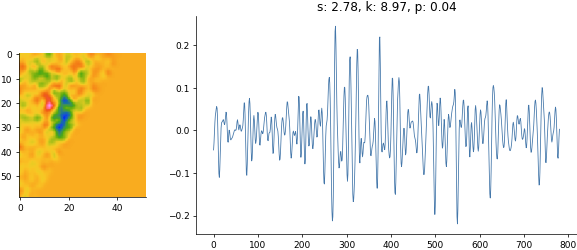

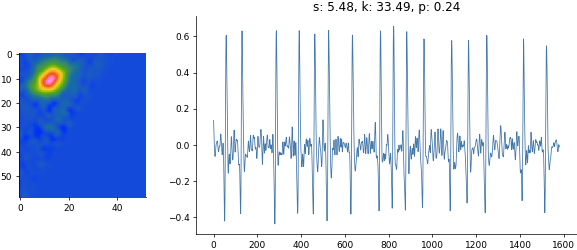

In [84]:
analysis_dir = os.path.join(rootdir, "analysis", subfolder, "individual_fish_recordings")
# for fpath in os.listdir(analysis_dir):
fpath = "E9"
embryo_path = os.path.join(analysis_dir, fpath)
filepaths = sorted([os.path.join(embryo_path, im_name) for im_name in os.listdir(embryo_path) if fpath in im_name])[-1::-1]
img = skio.imread(filepaths[-1])
n_comps_plot = 1

mean_img = img.mean(axis=0)
zeroed_img = img-mean_img
zeroed_img = ndimage.gaussian_filter(zeroed_img, (2,1,1)) 
zeroed_img -= ndimage.gaussian_filter1d(zeroed_img, 5, axis=0)
rd = zeroed_img.reshape((zeroed_img.shape[0], -1))
n_components = min(n_components, rd.shape[1])
pca = decomposition.PCA()
pca.fit(rd)
comp_magnitudes = np.abs(pca.components_)
skw = stats.skew(comp_magnitudes, axis=1)
krt = stats.kurtosis(comp_magnitudes, axis=1)

for i in range(n_comps_plot):
    comp = pca.components_[i]
    fig1, axes = plt.subplots(1,2, figsize=(10,4), gridspec_kw={"width_ratios":[1,3]})
    axes[0].imshow(comp.reshape(img.shape[1], img.shape[2]))
    axes[1].plot(rd@comp)
    axes[1].set_title("s: %.2f, k: %.2f, p: %.2f" % (skw[i], krt[i], pca.explained_variance_ratio_[i]))
    
img = skio.imread(filepaths[0])

mean_img = img.mean(axis=0)
zeroed_img = img-mean_img
zeroed_img = ndimage.gaussian_filter(zeroed_img, (2,1,1))
zeroed_img -= ndimage.gaussian_filter1d(zeroed_img, 5, axis=0)
rd = zeroed_img.reshape((zeroed_img.shape[0], -1))
n_components = min(n_components, rd.shape[1])
pca = decomposition.PCA()
pca.fit(rd)
comp_magnitudes = np.abs(pca.components_)
skw = stats.skew(comp_magnitudes, axis=1)
krt = stats.kurtosis(comp_magnitudes, axis=1)

for i in range(n_comps_plot):
    comp = pca.components_[i]
    fig1, axes = plt.subplots(1,2, figsize=(10,4), gridspec_kw={"width_ratios":[1,3]})
    axes[0].imshow(comp.reshape(img.shape[1], img.shape[2]))
    axes[1].plot(rd@comp)
    axes[1].set_title("s: %.2f, k: %.2f, p: %.2f" % (skw[i], krt[i], pca.explained_variance_ratio_[i]))

In [62]:
utils.reload_libraries(images)

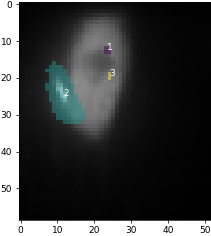

In [70]:
analysis_dir = os.path.join(rootdir, "analysis", subfolder, "individual_fish_recordings")
# for fpath in os.listdir(analysis_dir):
fpath = "E8"
embryo_path = os.path.join(analysis_dir, fpath)
filepaths = sorted([os.path.join(embryo_path, im_name) for im_name in os.listdir(embryo_path) if fpath in im_name])[-1::-1]
img = skio.imread(filepaths[-5])
a, b = images.identify_hearts(img, method="pca_moments", \
                    dilation_size=2, opening_size=1, bbox_offset=3, corr_threshold="None", \
                    krt_threshold=5, skw_threshold=2, ev_threshold=0.1, comp_mag_pct=97)

<>:4: DeprecationWarning: invalid escape sequence \d
<>:37: DeprecationWarning: invalid escape sequence \w


E9


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E9/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E9/analysis/automasks/E9_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E9/analysis/automasks/E9_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E8


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E8/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E8/analysis/automasks/E8_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E8/analysis/automasks/E8_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E12


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E12/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E12/analysis/automasks/E12_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E12/analysis/automasks/E12_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[

E13


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E13/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E13/analysis/automasks/E13_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E13/analysis/automasks/E13_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[

E11


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E11/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E11/analysis/automasks/E11_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E11/analysis/automasks/E11_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[

E0


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E0/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E0/analysis/automasks/E0_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E0/analysis/automasks/E0_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E1


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E1/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E1/analysis/automasks/E1_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E1/analysis/automasks/E1_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E2


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E2/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E2/analysis/automasks/E2_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E2/analysis/automasks/E2_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E3


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E3/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E3/analysis/automasks/E3_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E3/analysis/automasks/E3_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E4


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E4/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E4/analysis/automasks/E4_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E4/analysis/automasks/E4_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E10


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E10/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E10/analysis/automasks/E10_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E10/analysis/automasks/E10_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[

E7


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E7/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E7/analysis/automasks/E7_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E7/analysis/automasks/E7_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E6


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E6/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E6/analysis/automasks/E6_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E6/analysis/automasks/E6_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

E5


/tmp/ipykernel_237746/2538204348.py:33: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E5/analysis/mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E5/analysis/automasks/E5_074827_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/tmp/ipykernel_237746/2538204348.py:38: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220707_cochr_prebeat_excitability/analysis/corrected/individual_fish_recordings/E5/analysis/automasks/E5_075542_preheart_stim_t1_p1_z1_mask.tif is a low contrast image
  skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
/

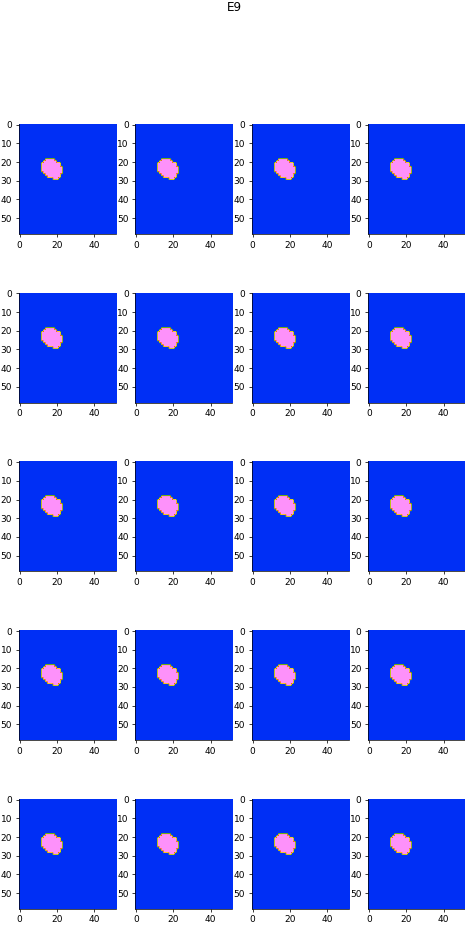

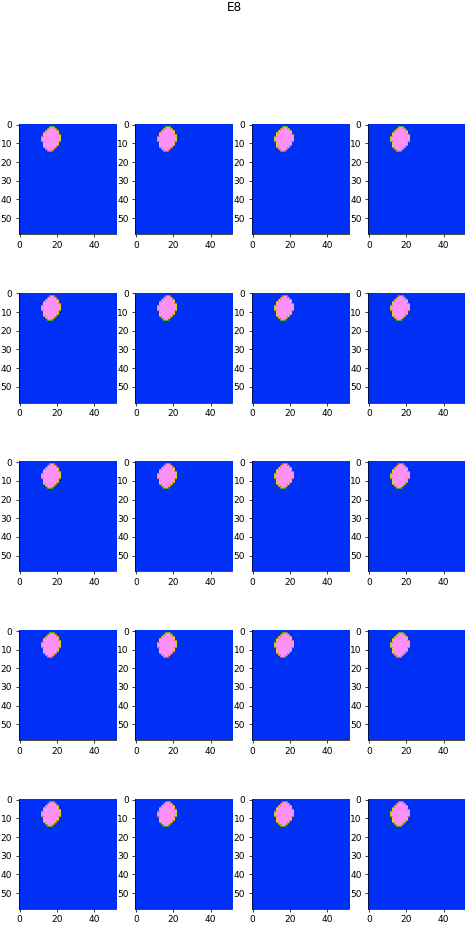

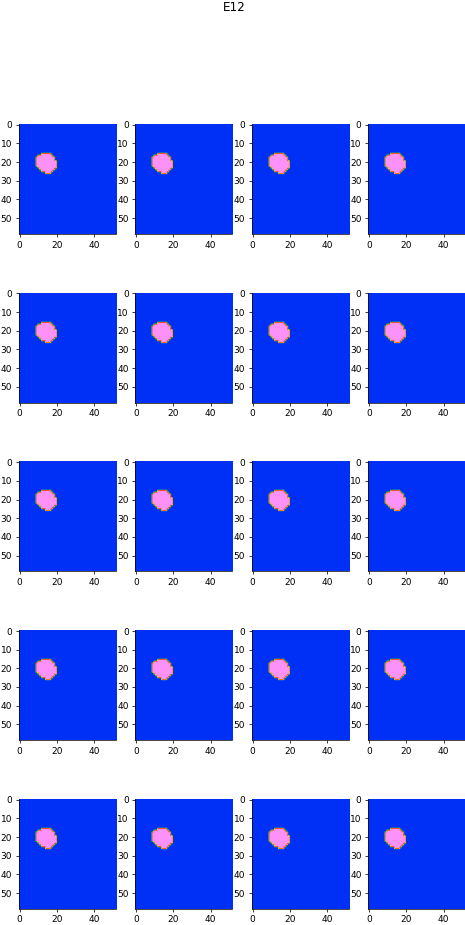

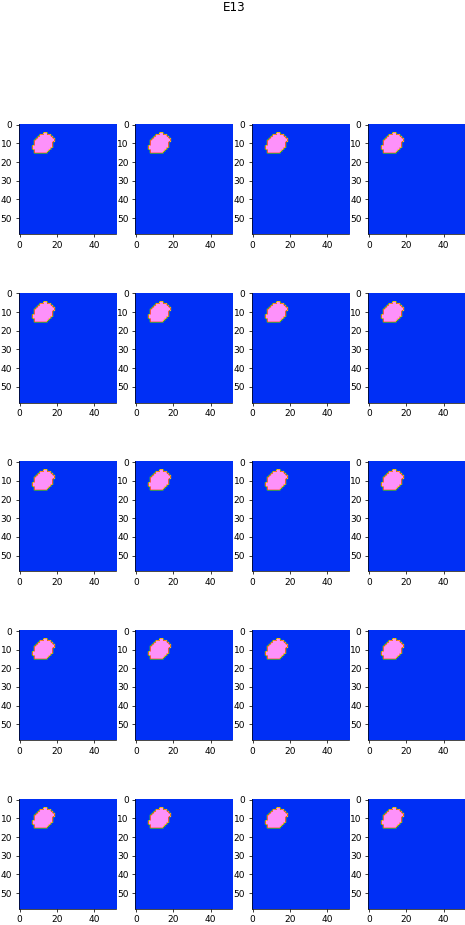

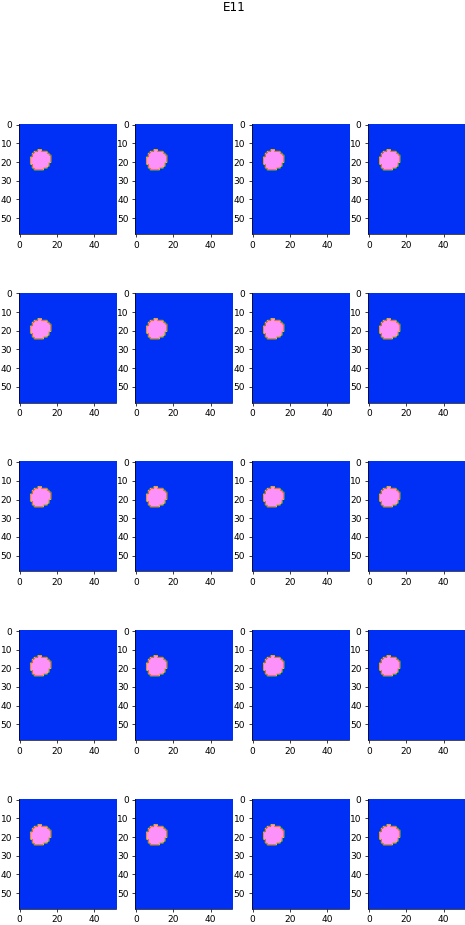

...

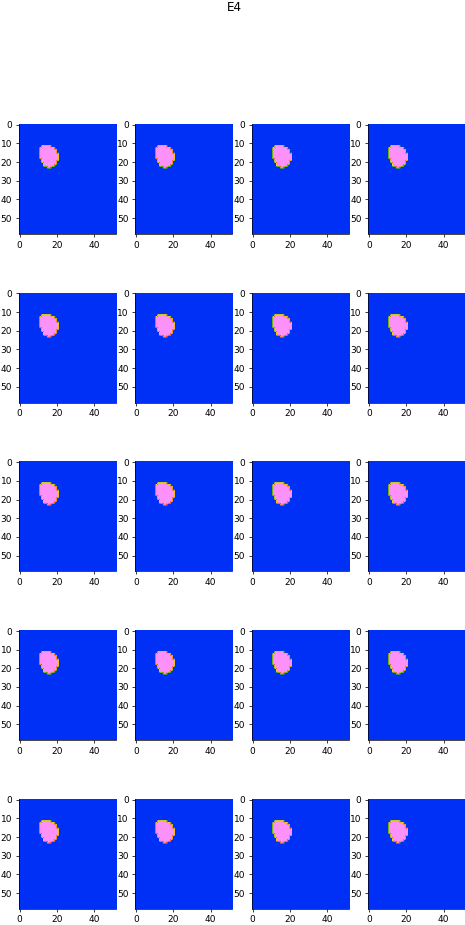

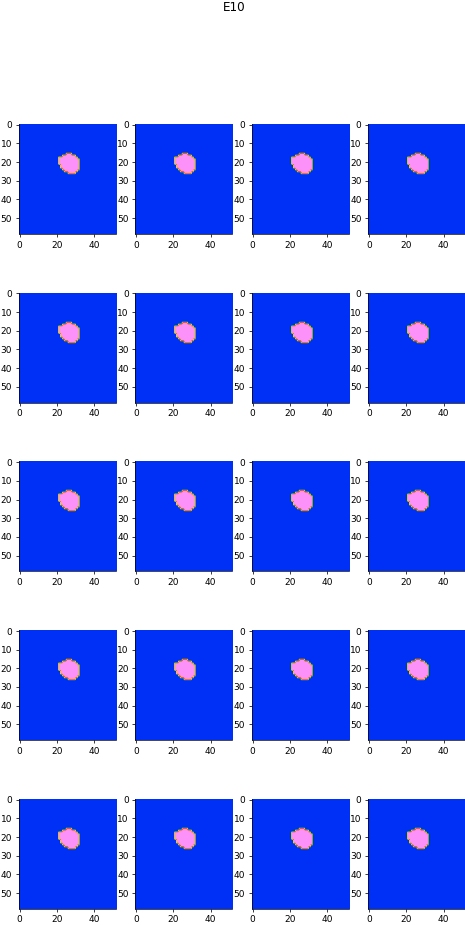

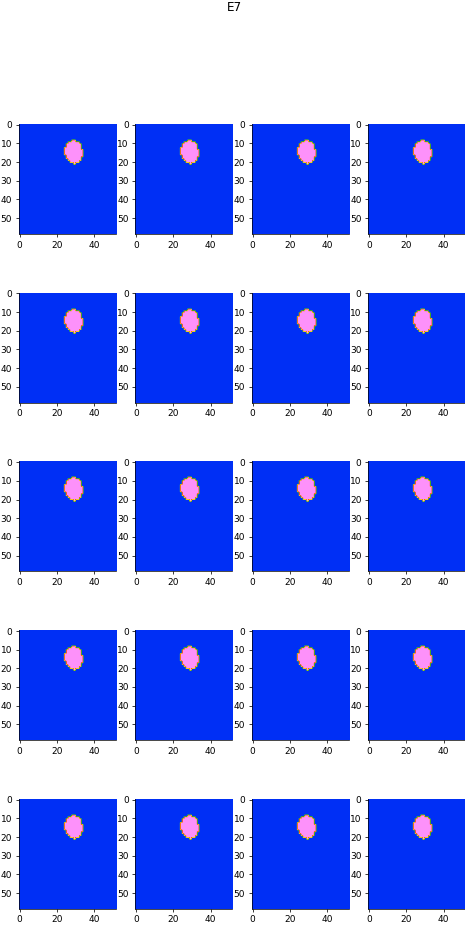

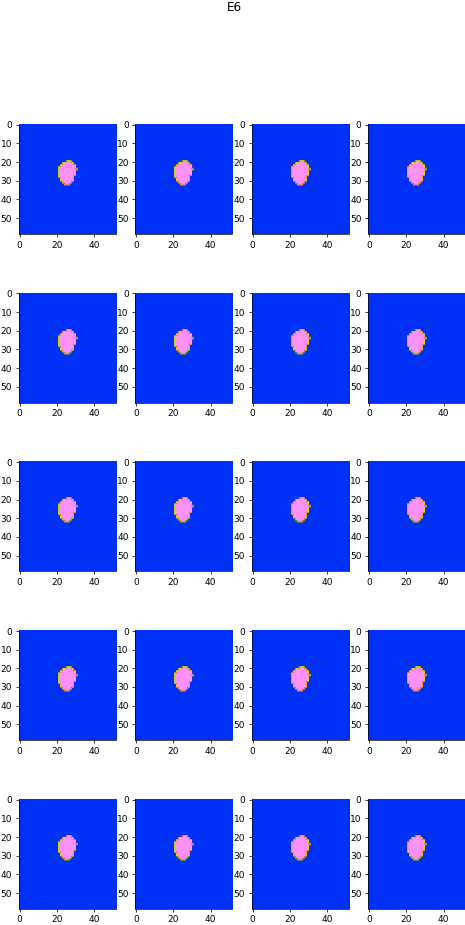

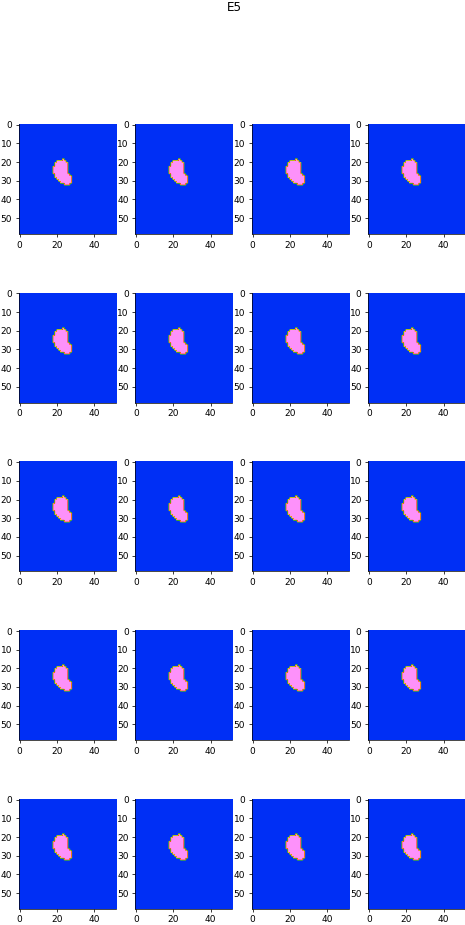

In [50]:
plt.close("all")
analysis_dir = rootdir/"analysis"/subfolder/"individual_fish_recordings"
for fpath in os.listdir(analysis_dir):
    if re.match("E\d+", fpath):
        print(fpath)
        embryo_path = os.path.join(analysis_dir, fpath)
        filepaths = sorted([os.path.join(embryo_path, im_name) for im_name in os.listdir(embryo_path) if fpath in im_name])[-1::-1]
#         print(filepaths)
        vid, excl = images.segment_widefield_series(filepaths, method="pca_moments", \
                        dilation_size=2, opening_size=1, bbox_offset=3, corr_threshold="None", \
                        krt_threshold=5, skw_threshold=2.5, ev_threshold=0.2, comp_mag_pct=97)
        for j in range(vid.shape[0]):
            
            value_counts = []
            for k in range(1,vid[j].max()+1):
                value_counts.append(np.sum(vid[j] ==k))
            try:
                vid[j] = (vid[j] == np.argmax(value_counts)+1)
            except Exception as e:
                pass
        flipped_vid = np.flip(images.link_stack(vid, radius=5), axis=0)
        for j in range(flipped_vid.shape[0]):
            value_counts = []

            for k in range(1,flipped_vid[j].max()+1):
                value_counts.append(np.sum(flipped_vid[j] ==k))
            try:
                flipped_vid[j] = (flipped_vid[j] == np.argmax(value_counts)+1)
                ax1.imshow(flipped_vid[j])
            except Exception as e:
                pass
        os.makedirs(os.path.join(embryo_path, "analysis/automasks"), exist_ok=True)
        skio.imsave(os.path.join(embryo_path, "analysis/mask.tif"), flipped_vid)
        np.savez(os.path.join(embryo_path, "analysis/exclude_indices.npz"), excl=np.flip(excl))
        fp_ascending = filepaths[-1::-1]
        for i in range(flipped_vid.shape[0]):
            im_name = re.search("%s_\w+(?=.tif)" % fpath, fp_ascending[i]).group(0)
            skio.imsave(os.path.join(embryo_path, "analysis/automasks/%s_mask.tif" % im_name), flipped_vid[i])
        fig1, axs = visualize.tile_plots_conditions(flipped_vid, subplot_size=(2,3), disp_titles=False)
        for ax in axs:
            ax.imshow(flipped_vid[i])
        fig1.suptitle(fpath)
#         break
#         print(len(filepaths))
#         break

### Now analyze stim experiments

Load all of the trace data

In [5]:
def load_firefly_waveforms(path, clock_rate=10000):
    arr = mat73.loadmat(os.path.join(rootdir, \
                        path, "waveforms.mat"))['wavesData'].astype(float)
    trace_names = ["camTrigger", "dmdTrigger", "grasshopperTrigger", \
                   "470LED", "orangeLED", "647laser", "561laser", "594laser",\
                   "594shutter", "ODWheel"]
    
    trace_dict = {}
    rising_edges = np.argwhere(np.diff(arr[:,0]) == 1).ravel()
    for idx, tn in enumerate(trace_names):
        trace_dict[tn] = np.zeros(len(rising_edges), dtype=float)
        for j in range(len(rising_edges)):
            if j ==0:
                trace_dict[tn][j] = np.max(arr[:rising_edges[j],idx])
            else:
                trace_dict[tn][j] = np.max(arr[rising_edges[j-1]:rising_edges[j],idx])
    t = rising_edges/clock_rate
    return trace_dict, t

In [6]:
q = mat73.loadmat(os.path.join(rootdir, "083301_preheart_stim_t1_p1_z1", "waveforms.mat"))

ERROR:root:ERROR: MATLAB type not supported: nidaq, (uint32)


In [7]:
def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
    http://nedbatchelder.com/blog/200712/human_sorting.html
    (See Toothy's implementation in the comments)
    '''
    return [ atoi(c) for c in re.split(r'(\d+)', text)]

In [8]:
analysis_dir = os.path.join(rootdir, "analysis", subfolder, "individual_fish_recordings")

sorted(os.listdir(analysis_dir), key=natural_keys)

['E0',
 'E1',
 'E2',
 'E3',
 'E4',
 'E5',
 'E6',
 'E7',
 'E8',
 'E9',
 'E10',
 'E11',
 'E12',
 'E13']

In [9]:
plt.close("all")
subfolder = "corrected"
analysis_dir = os.path.join(rootdir, "analysis", subfolder, "individual_fish_recordings")
all_embryo_traces = []
embryos = []
for ename in sorted(os.listdir(analysis_dir), key=natural_keys):
#     print(natural_keys(ename))
    #     map(int, re.findall(r'\d+', test_string)))[0]):
    if re.match("E\d+", ename):
#         print(os.path.join(analysis_dir, ename, "analysis"))
        embryo_traces = []
        embryos.append(ename)
        for idx, fname in enumerate(expt_info["file_name"]):
#             print(fname)
            try:
                trace = pd.read_csv(os.path.join(analysis_dir, ename, "analysis",\
                                "%s_%s_traces.csv" %(ename, fname)))["mean_intensity"].to_numpy()
                if idx < 2:
                    trace = np.repeat(trace, 2)
            except Exception as e:
                print(ename, fname)
#                 print(e)
                trace = np.zeros_like(embryo_traces[-1])
#             print(trace.shape)
            embryo_traces.append(trace)
        embryo_traces = utils.combine_jagged_arrays(embryo_traces)
        all_embryo_traces.append(embryo_traces)
all_embryo_traces = np.array(all_embryo_traces)

In [10]:
trace_dict, t = load_firefly_waveforms(os.path.join(rootdir, expt_info["file_name"].iloc[-1]))

ERROR:root:ERROR: MATLAB type not supported: nidaq, (uint32)


In [11]:
stims = t[np.diff(trace_dict["470LED"],prepend=0) > 0]
stim_indices = np.argwhere(np.diff(trace_dict["470LED"],prepend=0) > 0).ravel()

In [12]:
baseline = np.nanpercentile(all_embryo_traces, 10, axis=2)

In [13]:
dFF = all_embryo_traces / baseline[:,:,np.newaxis] -1

### Plot montages

In [14]:
def montage_along_axis(all_traces, axis, xvals=None, labels=None):
    """ for the given axis, make plots that scan across it for each value of the other axes
    """ 
    n_traces = all_traces.shape[axis]
    rearranged_traces = np.moveaxis(all_traces, axis, \
                        -2)
    if labels is None:
        labels = np.meshgrid([np.arange(dim) for dim in list(rearranged_traces.shape[:-2])]).ravel()
    rearranged_traces = rearranged_traces.reshape(-1, n_traces, all_traces.shape[-1])
    
    assert rearranged_traces.shape[0] == len(labels)
    figures = []
    axes = []
    for i in range(rearranged_traces.shape[0]):
        fig1, ax1 = plt.subplots(figsize= (10, 1.5*n_traces))
        visualize.stackplot(rearranged_traces[i], xvals=xvals, ax=ax1, flipud=True)
        ax1.set_title(labels[i])
        figures.append(fig1)
        axes.append(ax1)
    return figures, axes

All timepoints for each embryo

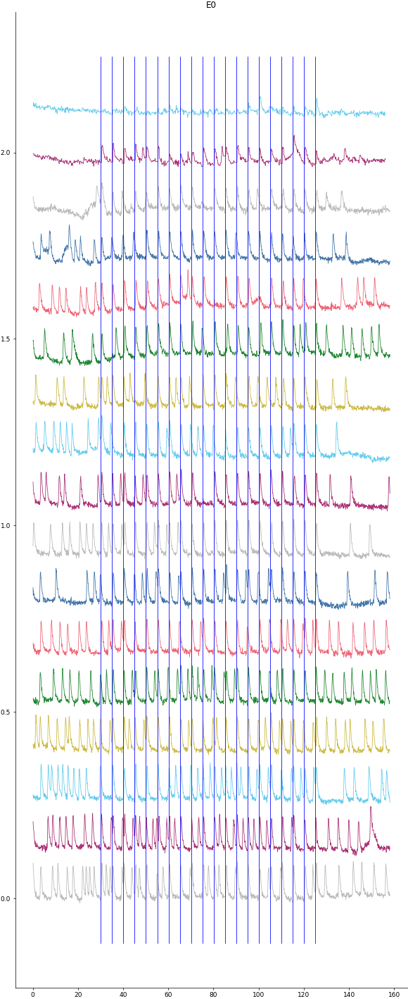

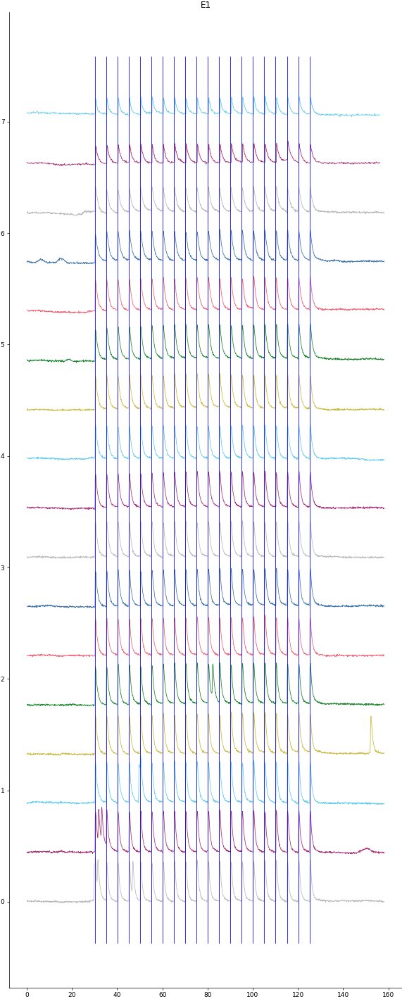

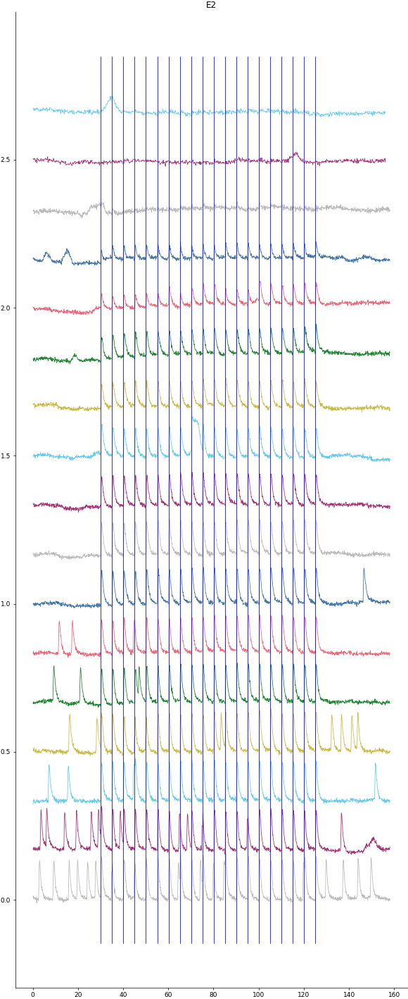

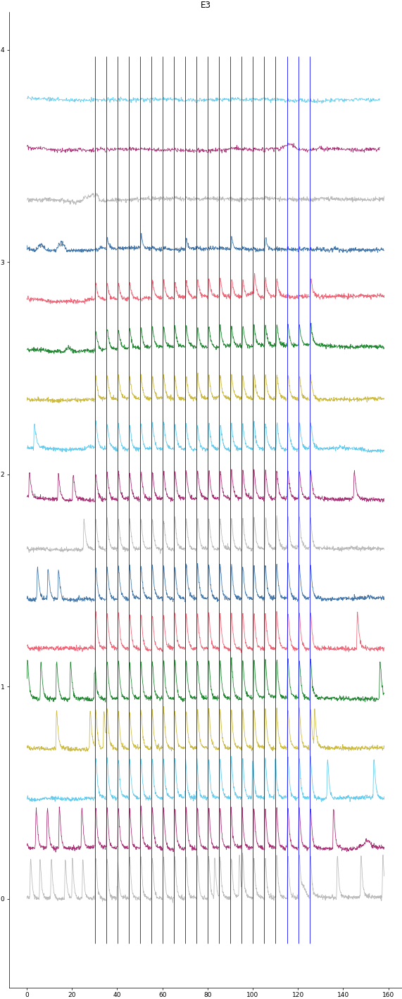

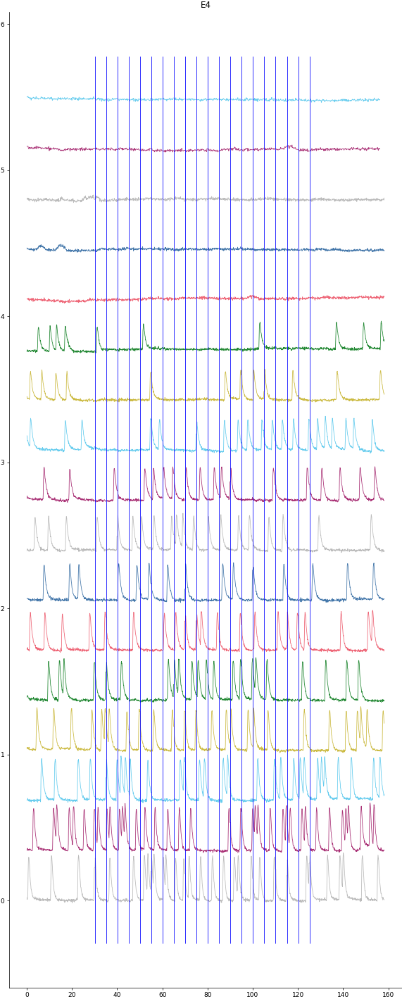

...

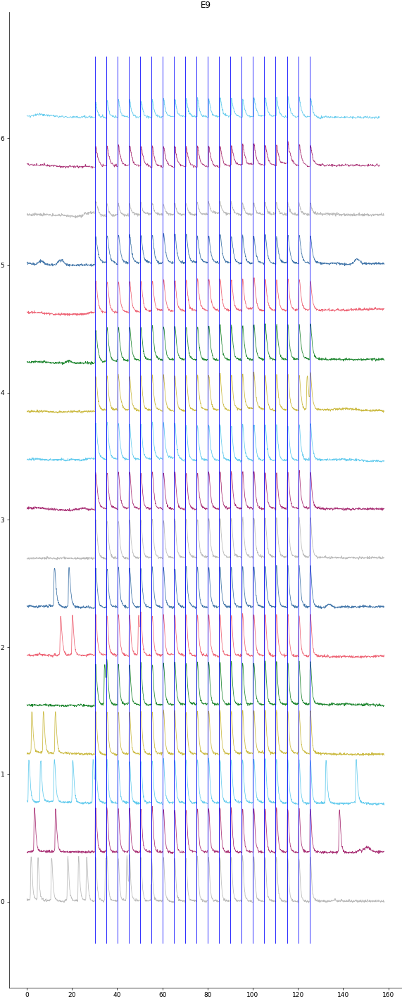

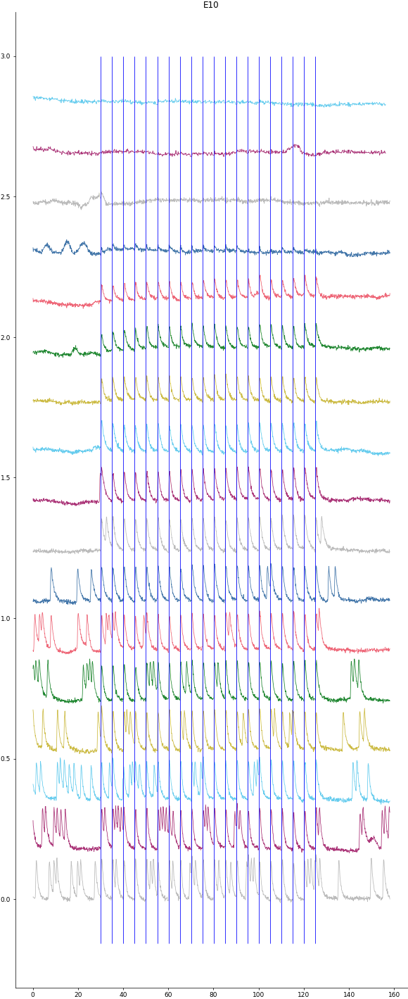

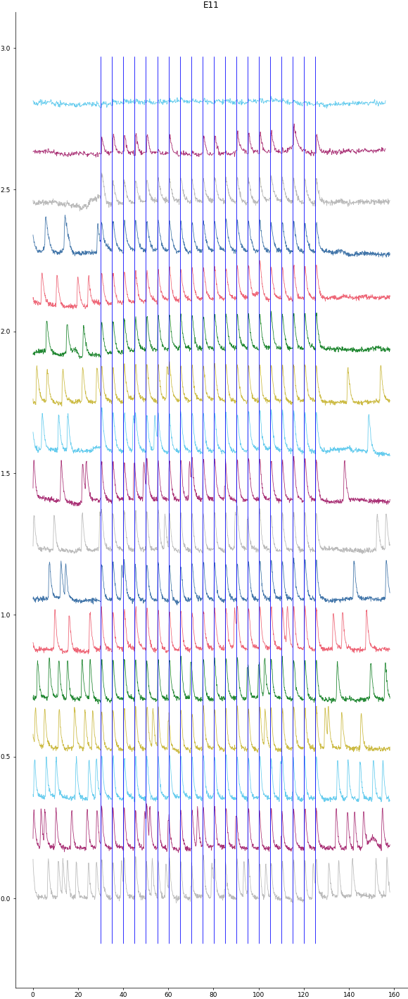

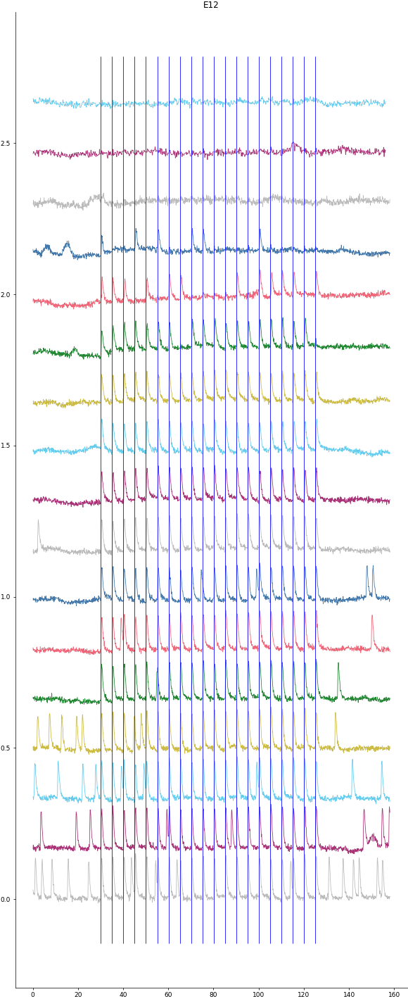

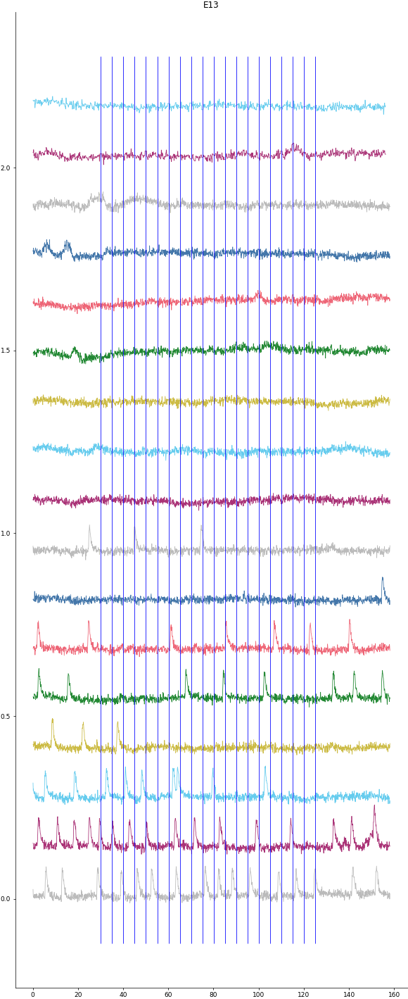

In [25]:
# New
%matplotlib inline
plt.close("all")
t = t[:dFF.shape[-1]]
figures, axes = montage_along_axis(dFF, 1, xvals=t, labels=embryos)
for j, ax in enumerate(axes):
    ylim = ax.get_ylim()
    ax.vlines(stims, *ylim, colors="blue")

Plot all embryos at each timepoint

/n/home11/bjia/SpikeCounter/spikecounter/ui/visualize.py:209: RuntimeWarning: All-NaN slice encountered
  offset = np.nanmax(np.nanmax(y, axis=1) - np.nanmin(y, axis=1))


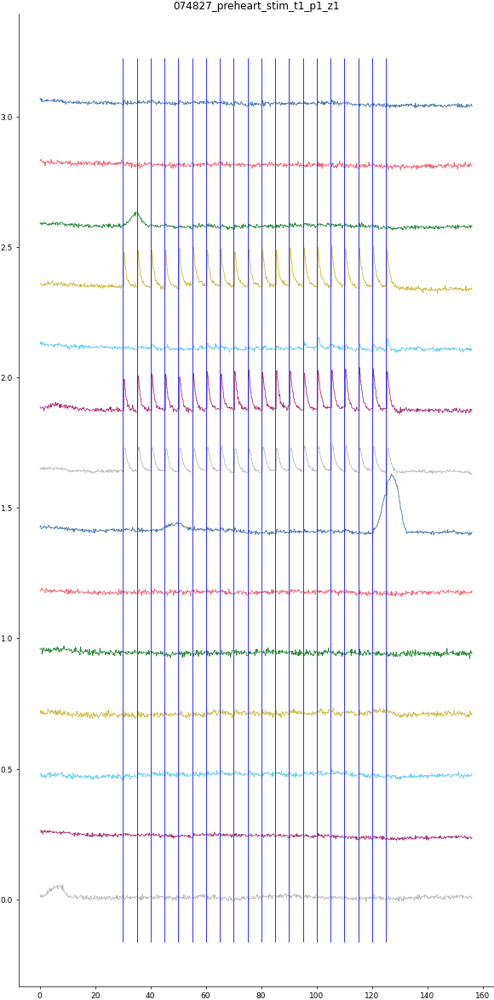

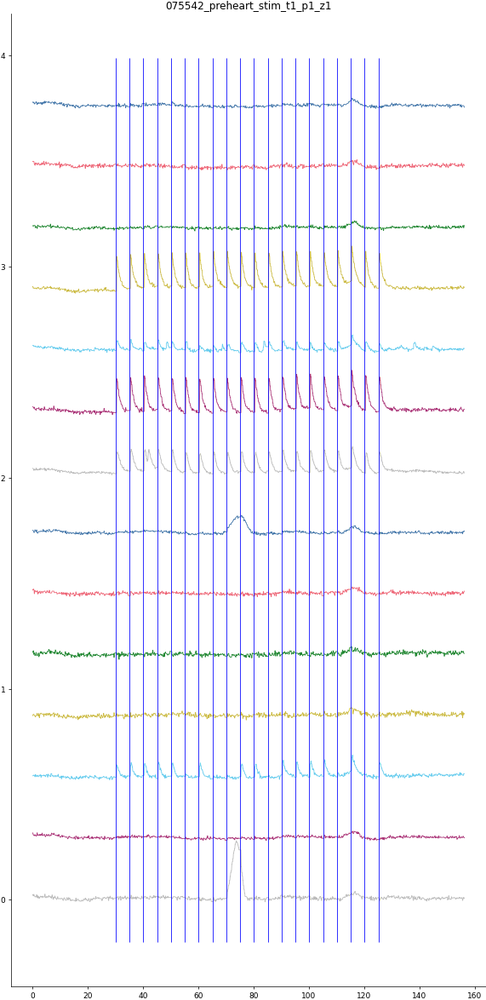

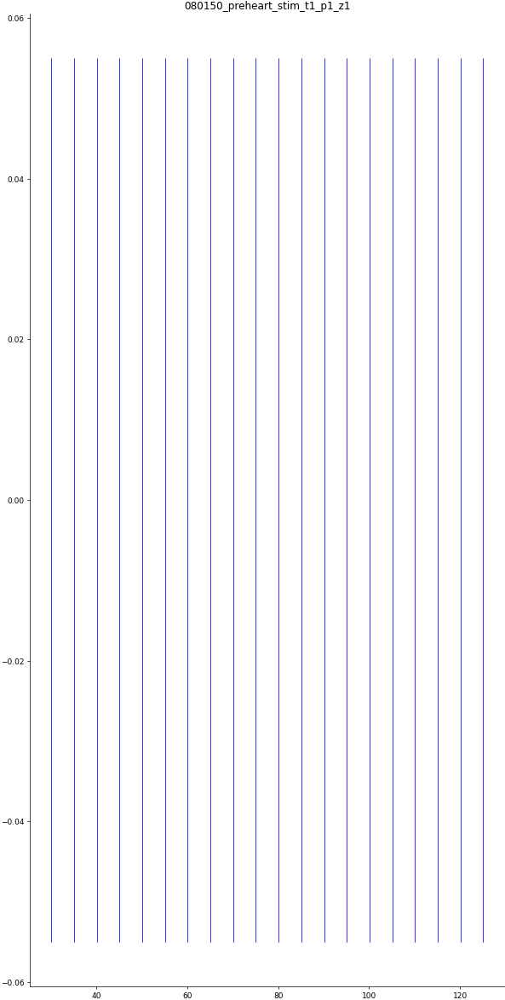

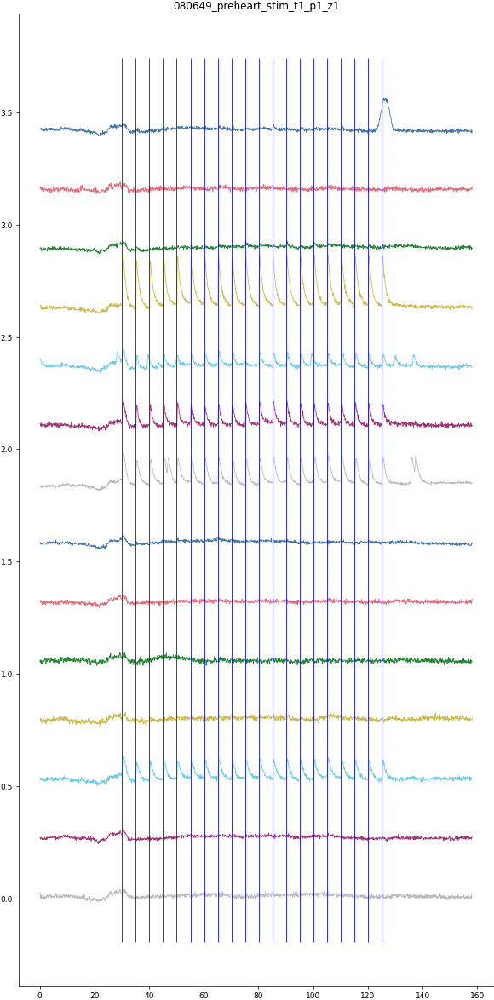

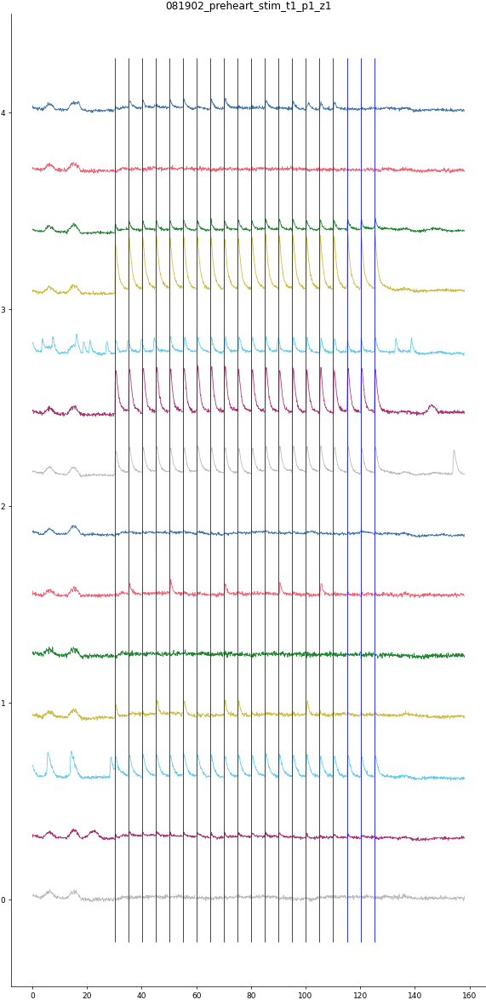

...

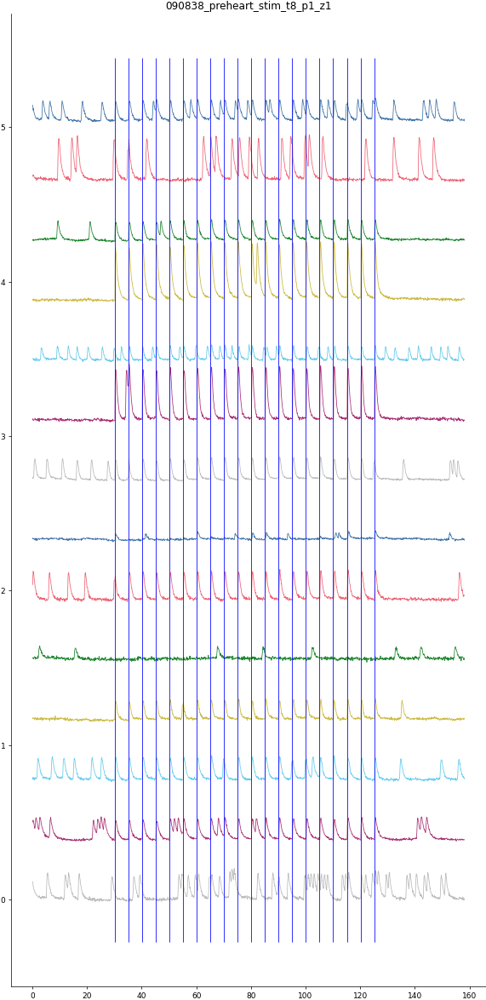

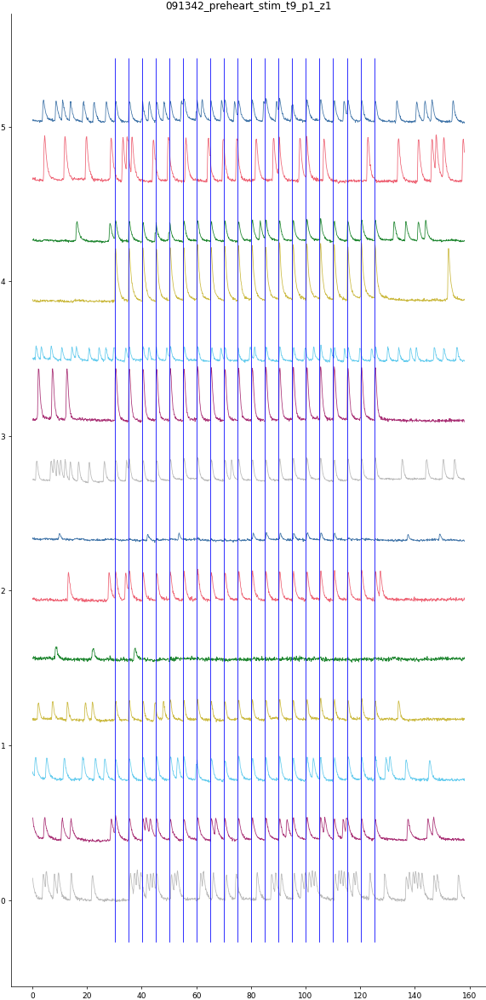

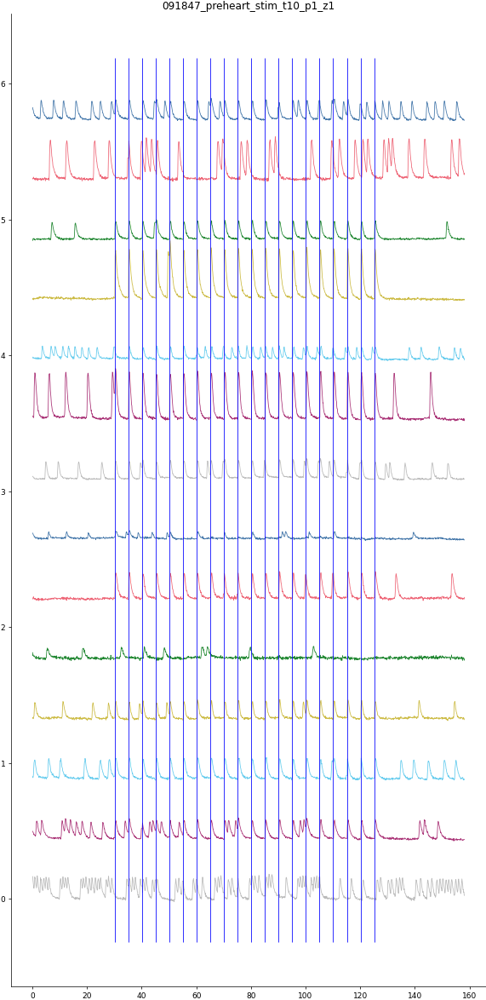

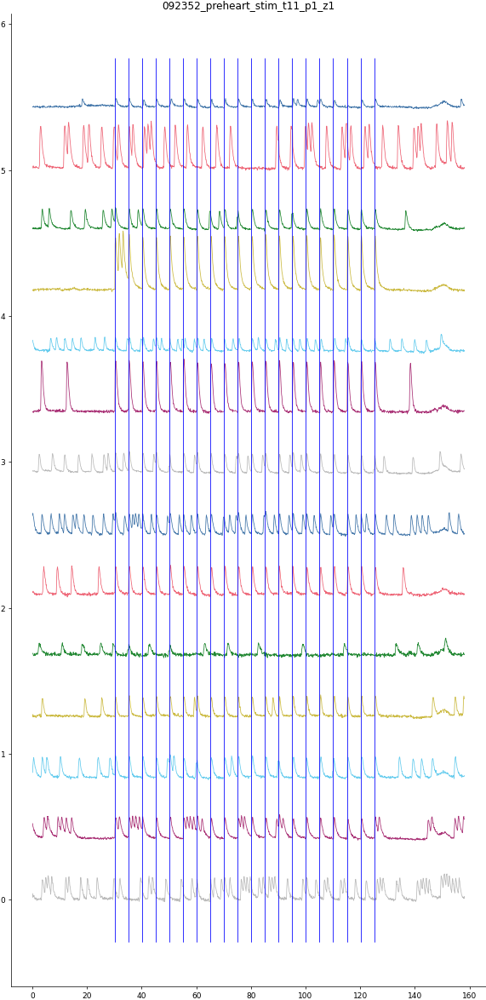

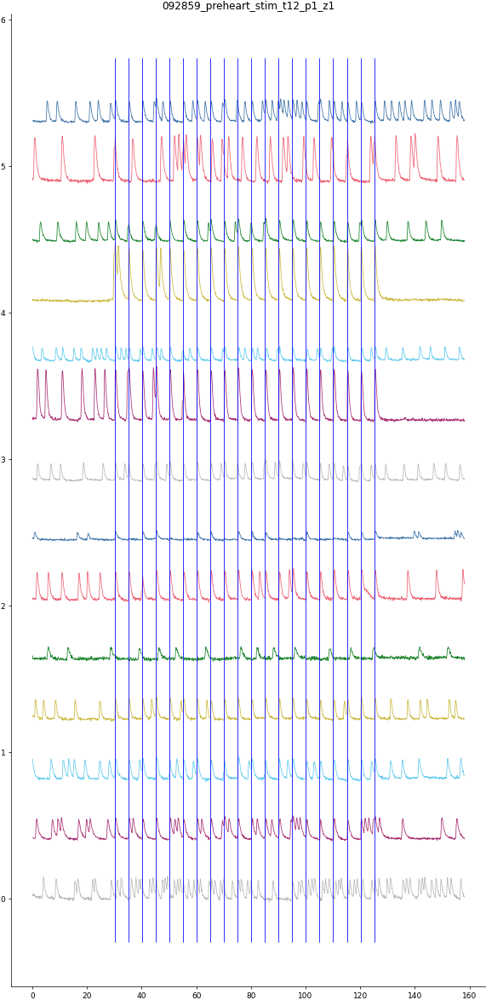

In [17]:
# New
plt.close("all")
t = t[:dFF.shape[-1]]
figures, axes = montage_along_axis(dFF, 0, xvals=t, labels=list(expt_info["file_name"]))
for j, ax in enumerate(axes):
    ylim = ax.get_ylim()
    ax.vlines(stims, *ylim, colors="blue")

### Plot selected traces

In [16]:
start_hpf = 20

In [17]:
# selected_timepoints = np.array([1,3,4,7,9,13])
selected_timepoints = np.array([1,2,3,6,8, 12])

In [18]:
selected_traces = dFF[12,selected_timepoints,:]
fs = 10.2

In [20]:
t

array([9.990000e-02, 1.999000e-01, 2.999000e-01, ..., 1.578999e+02,
       1.579999e+02, 1.580999e+02])

$6\%$
$\Delta F/F$


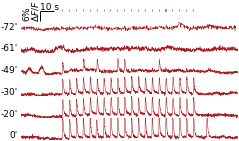

In [25]:
dt = 1/fs
ylim = 0.12
with plt.style.context(biopubs_style_path):
    fig1, axes = plt.subplots(selected_traces.shape[0], 1, figsize=(3.9,0.4*selected_traces.shape[0]))
    axes = axes.ravel()
    for i in range(selected_traces.shape[0]):
        axes[i].set_ylim((-0.01, ylim))
        axes[i].set_xlim((t.min(), t.max()))
        axes[i].set_axis_off()
        axes[i].plot(t, selected_traces[i], color="#A91F23", linewidth=0.5)

    #     if i == 0:

        hpf = expt_info.iloc[selected_timepoints[0]]["offset"]/3600 + start_hpf
    #         axes[i].text(-8, 0.04, "~%.1f hpf" %hpf, ha="right", weight="bold")
    #     else:
        offset = (expt_info.iloc[selected_timepoints[i]]["offset"] - \
                  expt_info.iloc[selected_timepoints[-1]]["offset"])/60
        axes[i].text(-2, 0, "%d\'" % offset, ha="right")
#         axes[i].vlines(stims, *axes[i].get_ylim(), colors="blue")
        if i == 0:
            for st in stims:
                r = patches.Rectangle((st, ylim*0.9), 0.02, ylim*0.1, color="#539AD3")
                axes[i].add_patch(r)
            xlim = axes[i].get_xlim()
            scalebar_params = {
                "corner_x": xlim[0]+14,
                "corner_y": ylim*0.9,
                "ampl_scale": ylim*0.5,
                "time_scale": 10,
                "fontsize": 9,
                "thickness": ylim*0.02,
                "xlabel_offset_y": ylim*0.1,
                "xlabel_offset_x": 0,
                "ylabel_offset_x": -14,
                "ylabel_offset_y": 0.01,
                "ylabel": r"$%d\%%$" "\n" r"$\Delta F/F$"
            }
            visualize.plot_scalebars(axes[i], scalebar_params, pct_f=True)
    plt.subplots_adjust(hspace=0.001)
    plt.savefig(output_datadir/"excitability_progression.svg", dpi=300, bbox_inches="tight")

$6\%$
$\Delta F/F$


NameError: name 'figdir' is not defined

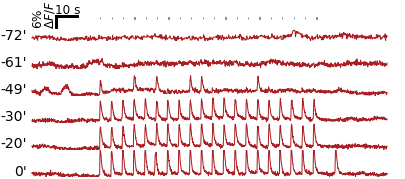

In [56]:
with plt.style.context("../bio_pubs_presentation.mplstyle"):
    dt = 1/fs
    ylim = 0.12
    fig1, axes = plt.subplots(selected_traces.shape[0], 1, figsize=(7,0.7*selected_traces.shape[0]))
    axes = axes.ravel()
    for i in range(selected_traces.shape[0]):
        axes[i].set_ylim((-0.01, ylim))
        axes[i].set_axis_off()
        axes[i].plot(t, selected_traces[i], color="#A91F23")

    #     if i == 0:

        hpf = expt_info.iloc[selected_timepoints[0]]["offset"]/3600 + start_hpf
    #         axes[i].text(-8, 0.04, "~%.1f hpf" %hpf, ha="right", weight="bold")
    #     else:
        offset = (expt_info.iloc[selected_timepoints[i]]["offset"] - \
                  expt_info.iloc[selected_timepoints[-1]]["offset"])/60
        axes[i].text(-2, 0, "%d\'" % offset, ha="right", fontsize=14)
        if i == 0:
            for st in stims:
                r = patches.Rectangle((st, ylim*0.8), 0.1, ylim*0.1, color="#539AD3")
                axes[i].add_patch(r)
            xlim = axes[i].get_xlim()
            scalebar_params = {
                "corner_x": xlim[0]+18,
                "corner_y": ylim*0.9,
                "ampl_scale": ylim*0.5,
                "time_scale": 10,
                "fontsize": 12,
                "thickness": ylim*0.07,
                "xlabel_offset_y": ylim*0.13,
                "xlabel_offset_x": 0,
                "ylabel_offset_x": -10,
                "ylabel_offset_y": 0.02,
                "ylabel": r"$%d\%%$" "\n" r"$\Delta F/F$"
            }
            visualize.plot_scalebars(axes[i], scalebar_params, pct_f=True)
    plt.subplots_adjust(hspace=0.001)

    plt.savefig(os.path.join(figdir, "Figure3","excitability_progression.svg"))

$6\%$
$\Delta F/F$


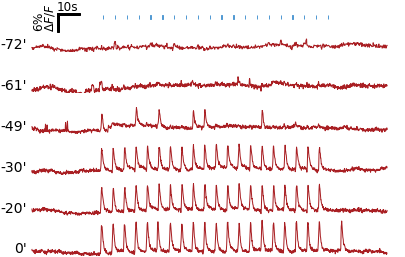

In [37]:
with plt.style.context("../bio_pubs_presentation.mplstyle"):
    dt = 1/fs
    ylim = 0.12
    fig1, axes = plt.subplots(selected_traces.shape[0], 1, figsize=(7,0.75*selected_traces.shape[0]))
    axes = axes.ravel()
    for i in range(selected_traces.shape[0]):
        axes[i].set_ylim((-0.01, ylim))
        axes[i].set_axis_off()
        axes[i].plot(t, selected_traces[i], color="#A91F23")

    #     if i == 0:

        hpf = expt_info.iloc[selected_timepoints[0]]["offset"]/3600 + start_hpf
    #         axes[i].text(-8, 0.04, "~%.1f hpf" %hpf, ha="right", weight="bold")
    #     else:
        offset = (expt_info.iloc[selected_timepoints[i]]["offset"] - \
                  expt_info.iloc[selected_timepoints[-1]]["offset"])/60
        axes[i].text(-2, 0, "%d\'" % offset, ha="right", fontsize=14)
        if i == 0:
            for st in stims:
                r = patches.Rectangle((st, ylim*0.8), 0.1, ylim*0.1, color="#539AD3")
                axes[i].add_patch(r)
            xlim = axes[i].get_xlim()
            scalebar_params = {
                "corner_x": xlim[0]+18,
                "corner_y": ylim*0.9,
                "ampl_scale": ylim*0.5,
                "time_scale": 10,
                "fontsize": 12,
                "thickness": ylim*0.07,
                "xlabel_offset_y": ylim*0.13,
                "xlabel_offset_x": 0,
                "ylabel_offset_x": -10,
                "ylabel_offset_y": 0.02,
                "ylabel": r"$%d\%%$" "\n" r"$\Delta F/F$"
            }
            visualize.plot_scalebars(axes[i], scalebar_params, pct_f=True)
    plt.subplots_adjust(hspace=0.001)

    plt.savefig(os.path.join(figdir, "Figure3","POSTER_excitability_progression.svg"))

### Analyze change in stimulus-triggered average

Quantify probability of stimulus response and the mean lag for stimulated and unstimulated conditions.

In [95]:
def calculate_lags(pks, start_idx, end_idx, ref_indices, plot=True):
    
    ax1 = None
    if len(pks) == 0:
        return np.array([]), np.array([]), np.array([]), 0, ax1
    if plot:
        fig1, ax1 = plt.subplots(figsize=(12,2))
        ax1.plot(filtered)
        ax1.plot(pks, filtered[pks], "rx")
#         ax1.plot(trace)
        ax1.set_ylim(-0.01, 0.45)
        ylim = ax1.get_ylim()

        ax1.vlines(ref_indices, ymin=ylim[0], ymax=ylim[1], color="black")
#         ax1.set_xlim(440, 460)
    
    stim_pks = pks[(pks >= start_idx)&(pks < end_idx)]
    mean_freq = len(stim_pks)/(end_idx-start_idx)
    pairwise_diff = np.subtract.outer(stim_pks, ref_indices)
    pairwise_diff[pairwise_diff<0] = np.iinfo(pairwise_diff.dtype).max
    mindist_indices = np.argmin(pairwise_diff, axis=1)
    mindist = pairwise_diff[np.arange(len(stim_pks)), mindist_indices]
    
    unique_stims, unique_indices = np.unique(mindist_indices, return_index=True)
    
    associated_stims = ref_indices[unique_stims]
    mindist = mindist[unique_indices].astype(float)
    trigger_pks = stim_pks[unique_indices]
    
    return trigger_pks, mindist, associated_stims, mean_freq, ax1

In [97]:
print(window.shape)

(3,)


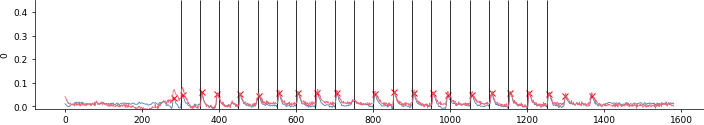

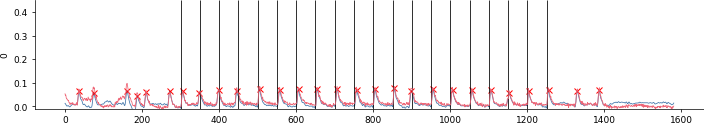

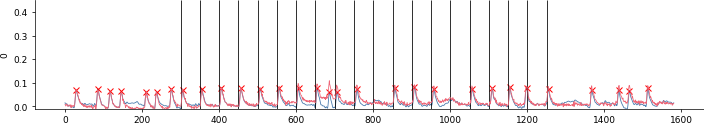

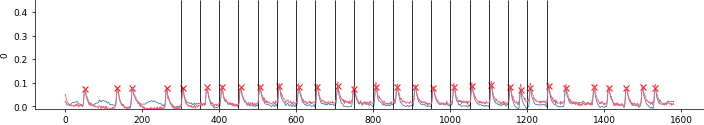

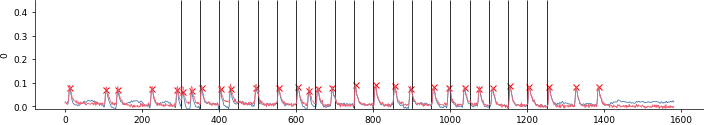

...

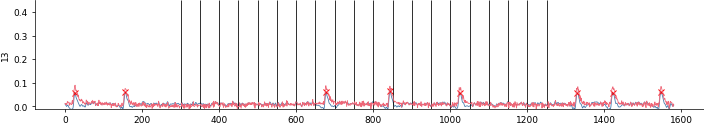

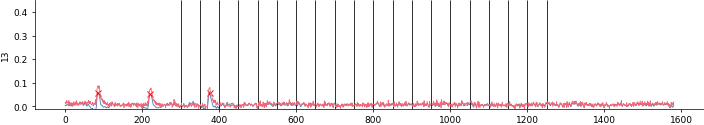

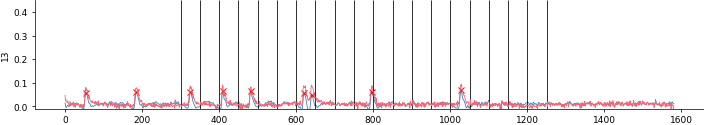

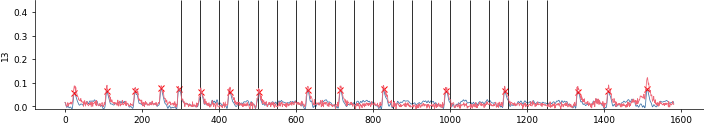

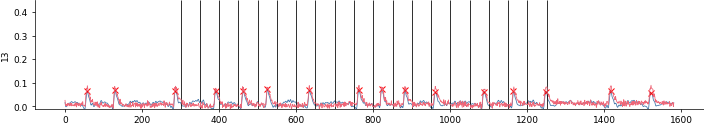

In [135]:
plt.close("all")
pad = 30
all_stim_data = []
all_endogenous_data = []
control_embryos = [4,8,13]
first_endogenous_pk_time = np.ones(dFF.shape[0])*np.nan
fs = 10.2

for embryo in range(dFF.shape[0]):
    for i in range(dFF.shape[1]):
        trace = dFF[embryo,i,:]
        prominence = max(np.percentile(trace,95)*0.5, 0.035)
        sos = signal.butter(7, (0.15, 1.8), btype="band", output="sos",fs=10)
        filtered = signal.sosfiltfilt(sos, trace - np.mean(trace))
        filtered -= np.percentile(filtered, 10)
    #     filtered = signal.savgol_filter(filtered, 5, 3)

        pks, _ = signal.find_peaks(filtered, prominence = prominence, width=3, rel_height=0.3)
        
        endogenous_pks = pks[(pks < stim_indices[0])|(pks >= stim_indices[-1]+pad)]
        endogenous_amplitude = np.mean(trace[endogenous_pks])
        
        if len(endogenous_pks) > 0 and np.isnan(first_endogenous_pk_time[embryo]):
            first_endogenous_pk_time[embryo] = endogenous_pks[0]/10 + expt_info["offset"].iloc[i]
        trigger_pks, mindist, associated_stims, mean_freq, ax1 = calculate_lags(pks, \
                                           stim_indices[0]-pad, stim_indices[-1]+pad, stim_indices)
#         print(trigger_pks)
        evoked_amplitude = trace[trigger_pks.astype(int)]
        if ax1 is not None:
            ax1.plot(trace)
            ax1.set_ylabel(embryo)
    #     print(len(mindist), len(associated_stims))
        if len(endogenous_pks) == 0:
            block_endo_data = pd.DataFrame({"expt": [expt_name]*2,
                                "embryo": [embryo]*2,
                                "cochr": [not(embryo in control_embryos)]*2,
                                "stim_trial": [i]*2,
                                "trial_t_offset": [expt_info["offset"].iloc[i]]*2,
                                "trace_pk_time": [np.nan]*2,
                                "pk_amplitude": [np.nan]*2,
                                "window": ["before", "after"]
            })
        else:
            n_peaks = len(endogenous_pks)
            window = np.zeros_like(endogenous_pks, dtype=object)
            window[endogenous_pks < stim_indices[0]] = "before"
            window[endogenous_pks >= stim_indices[-1]+pad] = "after"
            block_endo_data = pd.DataFrame({"expt": [expt_name]*n_peaks,
                                "embryo": [embryo]*n_peaks, 
                                "cochr": [not(embryo in control_embryos)]*n_peaks,
                                "stim_trial": [i]*n_peaks,
                                "trial_t_offset": [expt_info["offset"].iloc[i]]*n_peaks,
                                "trace_pk_time": endogenous_pks/fs,
                                "pk_amplitude": trace[endogenous_pks],
                                "window": window
            })
        if len(mindist) == 0:
            block_stim_data = pd.DataFrame({ "expt": [expt_name],
                                    "embryo": [embryo], 
                                    "cochr": [not(embryo in control_embryos)],
                                    "stim_trial": [i],
                                    "trial_t_offset": [expt_info["offset"].iloc[i]],
                                    "min_dist": [np.nan], 
                                    "assoc_stim": [np.nan],
                                    "mean_freq": [np.nan],
                                    "pk_time": [np.nan],
                                    "evoked_amplitude": [np.nan],
                                    "endogenous_amplitude": [np.nan]
                                   })
        else:
            ones = np.ones(len(mindist))
            mindist[mindist==np.iinfo(int).max] = np.nan
            block_stim_data = pd.DataFrame({"expt": [expt_name]*len(mindist),
                                            "embryo": ones*embryo, 
                                            "cochr": ones*(not(embryo in control_embryos)),
                                            "stim_trial": ones*i,
                                            "trial_t_offset": ones*expt_info["offset"].iloc[i],
                                            "min_dist": mindist, 
                                            "assoc_stim": associated_stims,
                                            "mean_freq": ones*mean_freq*fs,
                                            "pk_time": trigger_pks/fs,
                                            "evoked_amplitude": evoked_amplitude,
                                            "endogenous_amplitude": ones*endogenous_amplitude
                                           })
#         block_data = np.column_stack((ones*embryo, ones*(not(embryo in control_embryos)), ones*i, \
#                                       ones*expt_info["offset"].iloc[i], mindist, associated_stims, \
#                                       ones*mean_freq/0.1, evoked_amplitude, ones*endogenous_amplitude))
#         if block_data.shape[0] == 0:
# #             print("No spikes found")
#             block_data = np.array([embryo,not(embryo in control_embryos),i,expt_info["offset"].iloc[i],\
#                                   np.nan, np.nan, np.nan, np.nan, np.nan])[np.newaxis,:]
# #             print(block_data)
        all_stim_data.append(block_stim_data)
        all_endogenous_data.append(block_endo_data)

In [136]:
stim_df = pd.concat(all_stim_data, axis=0)
stim_df["first_endogenous"] = np.nan
stim_df = stim_df.set_index("embryo")
for e in range(len(first_endogenous_pk_time)):
    stim_df.loc[e, "first_endogenous"] = first_endogenous_pk_time[e]
stim_df["time_post_onset"] = stim_df["trial_t_offset"] - stim_df["first_endogenous"]

In [137]:
start_hpf = 20
endo_df = pd.concat(all_endogenous_data, axis=0)
endo_df["global_pk_time"] = endo_df["trial_t_offset"] + endo_df["trace_pk_time"] 
time_post_onset = endo_df.set_index("embryo")["global_pk_time"] - endo_df.groupby("embryo").min()["global_pk_time"]
endo_df = endo_df.set_index("embryo")
endo_df["time_post_onset"] = time_post_onset
endo_df["hpf"] = start_hpf + endo_df["global_pk_time"]/3600

(array([  1.,   1., 162., 409., 402.,  72.,  20.,   2.,   1.,   2.,   0.,
          0.,   1.,   1.,   1.,   1.,   1.,   0.,   2.,   0.,   0.,   1.,
          0.,   0.,   0.,   2.,   0.,   1.,   0.,   2.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   1.,
          0.,   2.,   1.,   1.,   2.]),
 array([ 0.        ,  1.02040816,  2.04081633,  3.06122449,  4.08163265,
         5.10204082,  6.12244898,  7.14285714,  8.16326531,  9.18367347,
        10.20408163, 11.2244898 , 12.24489796, 13.26530612, 14.28571429,
        15.30612245, 16.32653061, 17.34693878, 18.36734694, 19.3877551 ,
        20.40816327, 21.42857143, 22.44897959, 23.46938776, 24.48979592,
        25.51020408, 26.53061224, 27.55102041, 28.57142857, 29.59183673,
        30.6122449 , 31.63265306, 32.65306122, 33.67346939, 34.69387755,
        35.71428571, 36.73469388, 37.75510204, 38.7755102 , 39.79591837,
        40.81632653, 41.83673469, 42.85714286, 43.87755102, 44.89795918,
       

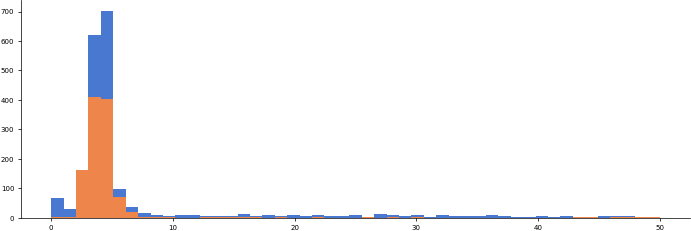

In [57]:
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.hist(stim_df["min_dist"][stim_df["time_post_onset"] > np.mean(np.diff(expt_info["offset"]))], bins=np.linspace(0,50,50))
ax1.hist(stim_df["min_dist"][stim_df["time_post_onset"] < np.mean(np.diff(expt_info["offset"]))], bins=np.linspace(0,50,50))

In [134]:
stim_df.reset_index().to_csv(os.path.join(output_datadir, "stim_spike_data.csv"), index=False)
endo_df.reset_index().to_csv(os.path.join(output_datadir, "endo_spike_data.csv"), index=False)